# Wonderful Wine of the World 

In [61]:
import os
from pathlib import Path
from math import ceil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import dump
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import classification_report, confusion_matrix, precision_score
import graphviz
import dtale
import phik
from phik import resources, report
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from sklearn.neighbors import LocalOutlierFactor
from numpy import quantile, where, random
import logging
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [102]:
def cor_heatmap(cor):
    plt.figure(figsize=(20,20))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Blues, fmt='.1')
    plt.show()


## Collect Initial Data

Loading the data : 

In [8]:
df = pd.read_excel('/Users/lilou/Desktop/GITHUB/GitHub/business-cases/BC1_customer_segmentation/WonderfulWinesoftheWorld.xlsx')

In [9]:
data = df.copy()

In [ ]:
data.drop(columns=['Rand','Access'])

In [10]:
data.head(5)

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
0,5325,653,55,20,78473,0,0,20,18,826,...,5,0,0,0,0,0,0,0,0,0
1,3956,1041,75,18,105087,0,0,36,33,1852,...,4,0,0,0,1,0,0,0,0,0
2,3681,666,18,12,27984,1,0,4,56,39,...,8,0,0,0,0,0,0,0,0,0
3,2829,1049,42,16,61748,1,1,2,46,37,...,7,0,0,0,0,0,0,0,1,1
4,8788,837,47,16,65789,0,1,2,3,36,...,6,0,0,0,0,0,0,0,0,0


### The variables of our dataset : 
##### Characteristics of customers : 
- CustID : customer ID 
- Dayswus : number of days as customers (500 days to 1250)
- Age : age of the customer
- Edu : number of year of education 
- Income :  household income
- Kidhome : Has a child under 13 year-old living at home ? (0=no, 1=yes)
- Teenhome : has a teenager 13-19 year-old living at home ? (0=no, 1=yes)
- LTV : Lifetime value of the customer

##### Behavior characteristics of customers : 
- Freq : number of purchase the last 18 months 
- Recency :  number of days of the last purchase
- Monetary : total sales of the client in the last 18 months
- Perdeal : percentage of wine bought on discount
- Complain : made a complaint in the last 18 months (0=no, 1=yes)
- Mailfriend : Mail friendly customers (0=no, 1=yes)
- Emailfriend : Email friendly customers (0=no, 1=yes)
- WebPurchase : percentage of purchases made on website 
- WebVisit : average numbers of visits to website per month    

##### Type of wines bought by customers  : 
- Dryred : percentage of wines that were dry red wines  
- Sweetred : percentage sweet or semi-dry reds  
- Drywh : percentage dry white wines
- Sweetwh : percentage sweet or semi-dry white wines
- Dessert : percentage dessert wines (port, sherry, etc.)
- Exotic : percentage very unusual wine 

##### Accessories bought by customers : 
- SMRack : bought the small wine rack 50 dollars (0=no, 1=yes)
- LGRack : bought the large wine rack 100 dollars(0=no, 1=yes)
- Humid : bought wine cellar humidifier 75 dollars(0=no, 1=yes)
- Spcork : silver-plated cork extractor 60 dollars (0=no, 1=yes)
- Bucket : bought silver wine bucket 150 dollars (0=no, 1=yes)
- Access : number of accessories (not SPCORK)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   Custid       10000 non-null  int64
 1   Dayswus      10000 non-null  int64
 2   Age          10000 non-null  int64
 3   Edu          10000 non-null  int64
 4   Income       10000 non-null  int64
 5   Kidhome      10000 non-null  int64
 6   Teenhome     10000 non-null  int64
 7   Freq         10000 non-null  int64
 8   Recency      10000 non-null  int64
 9   Monetary     10000 non-null  int64
 10  LTV          10000 non-null  int64
 11  Perdeal      10000 non-null  int64
 12  Dryred       10000 non-null  int64
 13  Sweetred     10000 non-null  int64
 14  Drywh        10000 non-null  int64
 15  Sweetwh      10000 non-null  int64
 16  Dessert      10000 non-null  int64
 17  Exotic       10000 non-null  int64
 18  WebPurchase  10000 non-null  int64
 19  WebVisit     10000 non-null  int64
 20  SMRack 

In [12]:
data.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
Custid,10000.0,6000.5000,2886.895680,1001.0,3500.75,6000.5,8500.25,11000.0
Dayswus,10000.0,898.1020,202.492789,550.0,723.75,894.0,1074.00,1250.0
Age,10000.0,47.9273,17.302721,18.0,33.00,48.0,63.00,78.0
Edu,10000.0,16.7391,1.876375,12.0,15.00,17.0,18.00,20.0
Income,10000.0,69904.3580,27612.233311,10000.0,47642.00,70012.0,92147.00,140628.0
Kidhome,10000.0,0.4188,0.493387,0.0,0.00,0.0,1.00,1.0
Teenhome,10000.0,0.4698,0.499112,0.0,0.00,0.0,1.00,1.0
Freq,10000.0,14.6281,11.969073,1.0,4.00,12.0,24.00,56.0
Recency,10000.0,62.4068,69.874255,0.0,26.00,52.0,78.25,549.0
Monetary,10000.0,622.5552,647.135323,6.0,63.00,383.0,1077.00,3052.0


In [13]:
data.isnull().sum()

Custid         0
Dayswus        0
Age            0
Edu            0
Income         0
Kidhome        0
Teenhome       0
Freq           0
Recency        0
Monetary       0
LTV            0
Perdeal        0
Dryred         0
Sweetred       0
Drywh          0
Sweetwh        0
Dessert        0
Exotic         0
WebPurchase    0
WebVisit       0
SMRack         0
LGRack         0
Humid          0
Spcork         0
Bucket         0
Access         0
Complain       0
Mailfriend     0
Emailfriend    0
dtype: int64

In [14]:
data.loc[data.duplicated(keep=False), :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend


In [15]:
data = data.sort_values(by = 'Custid')
data = data.set_index('Custid')
data.head()

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,,,,,,,,,,,,
1001,789,68,16,90782,0,0,29,66,1402,699,...,4,0,1,0,0,0,1,0,0,0
1002,623,78,20,113023,0,0,31,6,1537,565,...,1,0,0,0,0,0,0,0,0,0
1003,583,24,18,28344,1,0,4,69,44,-3,...,7,1,0,0,0,0,1,0,1,1
1004,893,59,19,93571,0,1,21,10,888,207,...,5,0,0,0,0,0,0,0,0,0
1005,1062,59,18,91852,0,1,25,26,1138,355,...,6,0,0,0,1,0,0,0,0,0


In [25]:
non_metric_features = ['Kidhome','Teenhome', 'SMRack', 'LGRack', 'Humid',
                       'Spcork','Bucket','Complain','Mailfriend','Emailfriend', 'Access']
metric_features = data.columns.drop(non_metric_features).to_list()

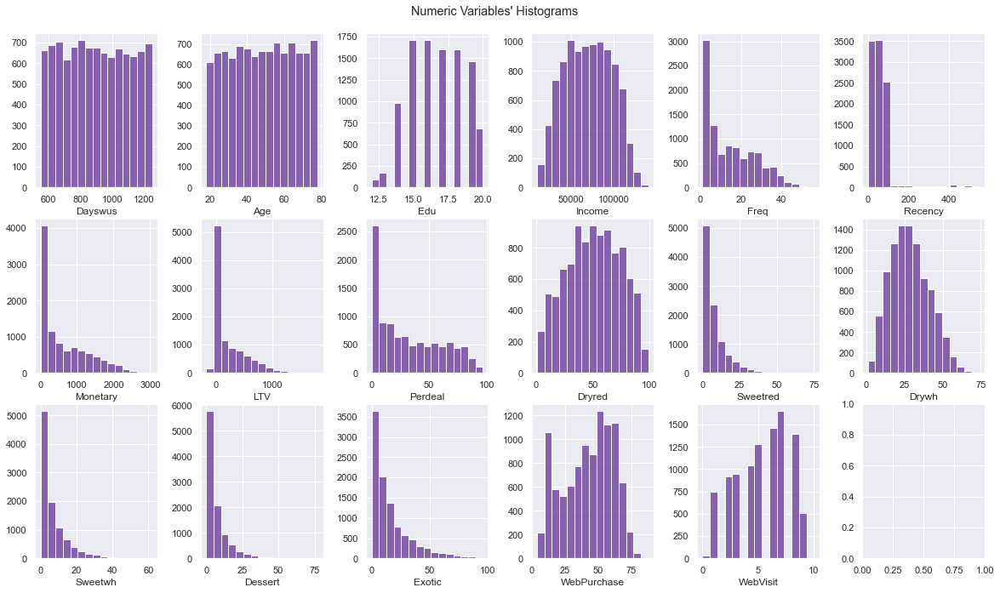

In [152]:
sns.set()
fig, axes = plt.subplots(3, ceil(len(metric_features) / 3), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(data[feat], color = "rebeccapurple", ax = ax, bins=15 )
    ax.set_ylabel('')
plt.subplots_adjust(wspace = 0.35, bottom = 0.1)
title = "Numeric Variables' Histograms"
plt.suptitle(title, y=0.92)
plt.show()

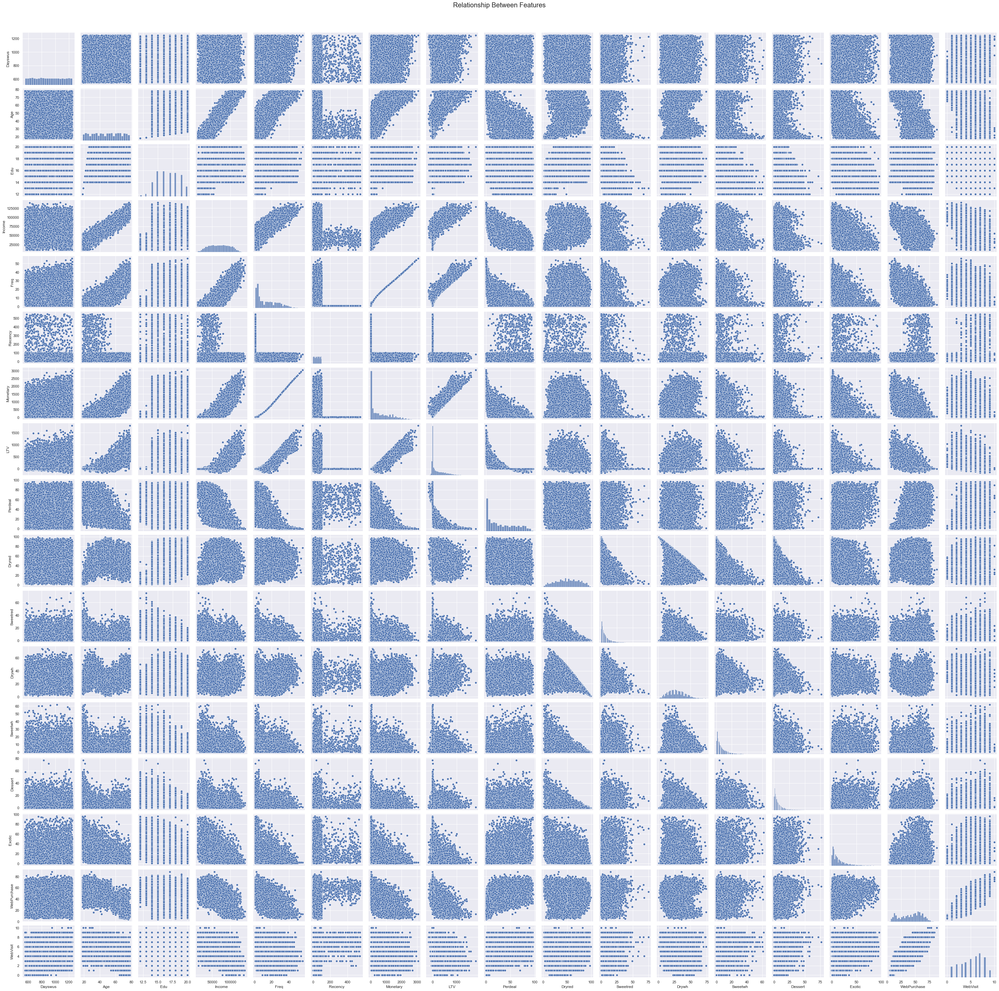

In [28]:

sns.set()
features = metric_features
sns.pairplot(data=data[features], diag_kind="hist")
plt.subplots_adjust(top=0.95)
plt.suptitle("Relationship Between Features", fontsize=20)

plt.show()

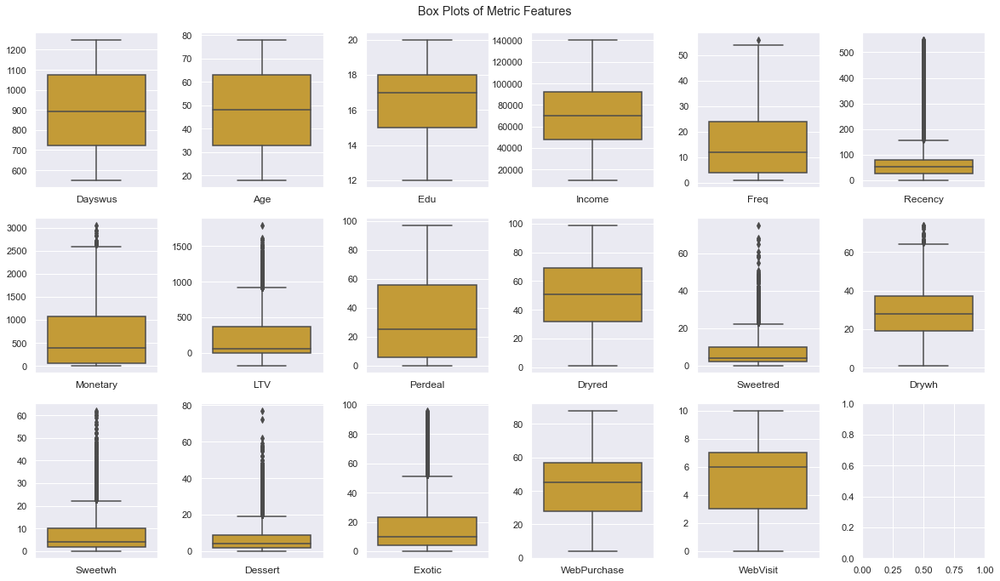

In [139]:
#Metric Features Boxplot
sns.set()
fig, axes = plt.subplots(3, ceil(len(metric_features) / 3), figsize=(20, 11))
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(y=data[feat], ax=ax, color = 'goldenrod')
    ax.set_title(feat, y=-0.13)
    ax.set_ylabel('')

plt.subplots_adjust(wspace = 0.35, bottom = 0.1)
title = "Box Plots of Metric Features"
plt.suptitle(title, y=0.92)
plt.show()

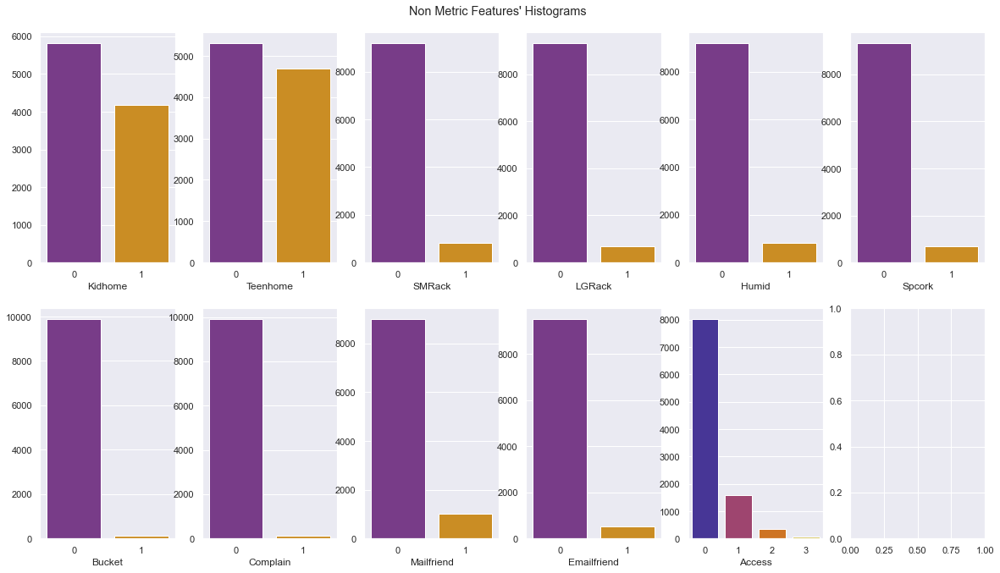

In [145]:
# Non metric features
sns.set()
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(20, 11))
for ax, feat in zip(axes.flatten(), non_metric_features):
    sns.countplot(x=data[feat], data=data[non_metric_features], ax = ax, palette = 'CMRmap')
    ax.set_ylabel("")

title = "Non Metric Features' Histograms"
plt.suptitle(title,y=0.92)
plt.show()

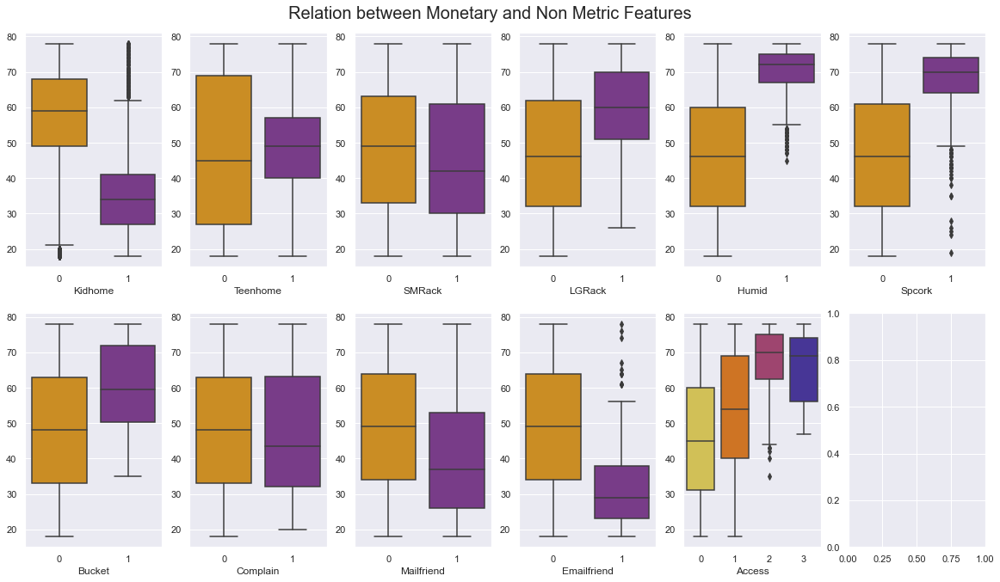

In [144]:
fig, ax = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(20, 11))
for var, subplot in zip(non_metric_features, ax.flatten()):
    sns.boxplot(x=var, y=data['Age'], data=data, ax=subplot, palette='CMRmap_r')
    subplot.set_ylabel('')
    
title = "Relation between Monetary and Non Metric Features"
plt.suptitle(title, fontsize = 20, y=0.92)
plt.show()
    

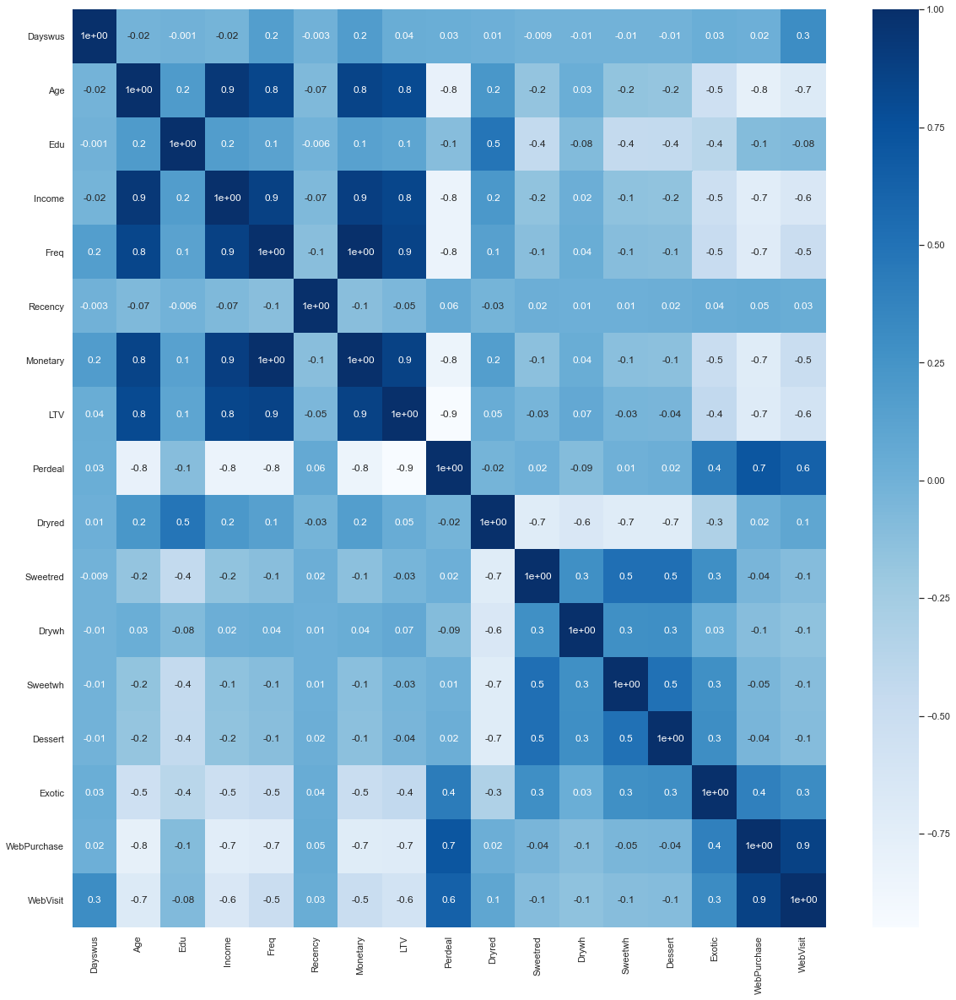

In [105]:
def cor_heatmap(cor):
    plt.figure(figsize=(20,20))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Blues, fmt='.1')
    plt.show()  

# HeatMap of Metric features 
cor_all = data[metric_features].corr(method = "spearman")
cor_heatmap(cor_all)

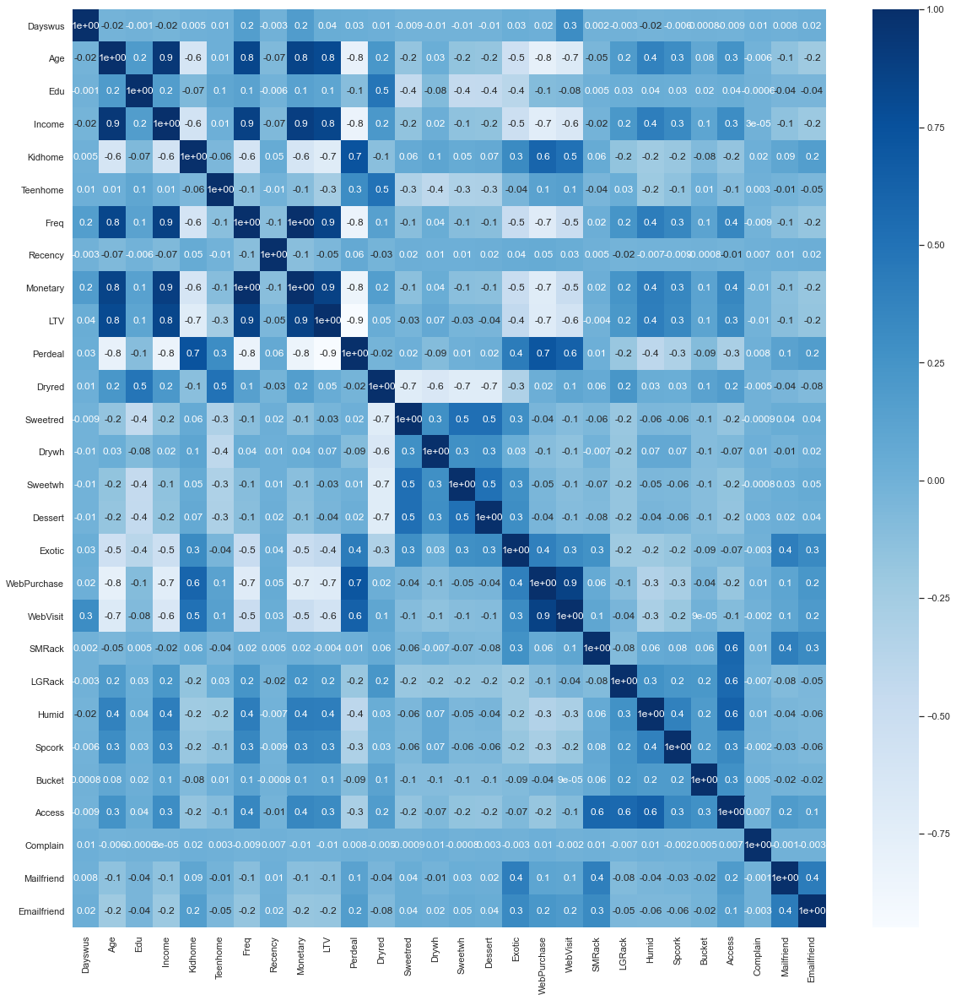

In [106]:
#HeatMap of all features
cor_all2 = data.corr(method = "spearman")
cor_heatmap(cor_all2)

In [108]:
HighCorr = ['Age', 'Income', 'Kidhome','Freq','Monetary','LTV','Perdeal',
            'WebPurchase','SMRack','LGRack','Humid','Spcork','Bucket', 'Mailfriend','Emailfriend']

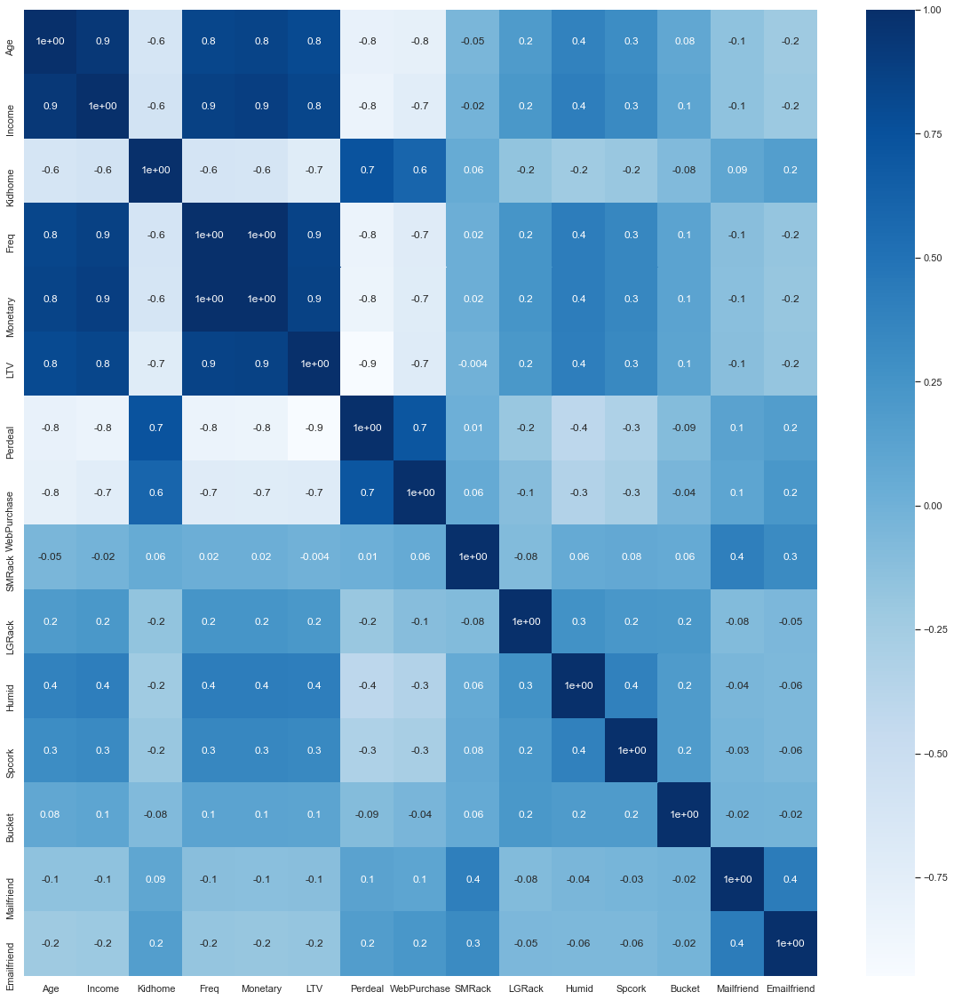

In [109]:
cor_high = data[HighCorr].corr(method = "spearman")
cor_heatmap(cor_high)

Perdeal and Webpurchase have almost the same correlation (possibility to drop one of them)
SmRack - LGrack - Humid - Spcork - Bucket (Accessories for wines)


In [291]:
data.phik_matrix()

interval columns not set, guessing: ['Dayswus', 'Age', 'Edu', 'Income', 'Kidhome', 'Teenhome', 'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit', 'SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Complain', 'Mailfriend', 'Emailfriend']


,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
Dayswus,1.000000,0.000000,0.000000,0.041121,0.026506,0.002628,0.196964,0.000000,0.184042,0.121312,...,0.333655,0.000000,0.003997,0.030222,0.011924,0.000000,0.000000,0.017064,0.006249,0.009875
Age,0.000000,1.000000,0.403023,0.879422,0.843389,0.805866,0.781237,0.230169,0.768051,0.778483,...,0.695886,0.086179,0.313297,0.616196,0.451857,0.158429,0.313827,0.017141,0.190134,0.300866
Edu,0.000000,0.403023,1.000000,0.306725,0.107414,0.142240,0.157482,0.061625,0.136923,0.149287,...,0.094505,0.000000,0.044983,0.047954,0.045160,0.009341,0.032973,0.019695,0.068926,0.073762
Income,0.041121,0.879422,0.306725,1.000000,0.773231,0.637133,0.831688,0.250940,0.818649,0.816506,...,0.640590,0.062073,0.298690,0.756152,0.507508,0.168674,0.398233,0.010247,0.193610,0.285611
Kidhome,0.026506,0.843389,0.107414,0.773231,1.000000,0.084593,0.783033,0.200251,0.762637,0.873128,...,0.657934,0.084873,0.247146,0.348652,0.299478,0.119398,0.272474,0.016769,0.146767,0.254774
Teenhome,0.002628,0.805866,0.142240,0.637133,0.084593,1.000000,0.492190,0.033633,0.470654,0.502575,...,0.455647,0.060382,0.041017,0.324940,0.225860,0.008489,0.171995,0.000000,0.012383,0.077780
Freq,0.196964,0.781237,0.157482,0.831688,0.783033,0.492190,1.000000,0.271440,0.991262,0.905337,...,0.552426,0.078947,0.348242,0.780965,0.602487,0.221517,0.460039,0.000000,0.158747,0.239818
Recency,0.000000,0.230169,0.061625,0.250940,0.200251,0.033633,0.271440,1.000000,0.220250,0.242155,...,0.111616,0.000000,0.065707,0.076675,0.064056,0.000000,0.045146,0.027926,0.061855,0.075887
Monetary,0.184042,0.768051,0.136923,0.818649,0.762637,0.470654,0.991262,0.220250,1.000000,0.898507,...,0.554230,0.065224,0.350071,0.780223,0.600449,0.220837,0.458435,0.000000,0.142265,0.229271
LTV,0.121312,0.778483,0.149287,0.816506,0.873128,0.502575,0.905337,0.242155,0.898507,1.000000,...,0.589448,0.058792,0.311351,0.741158,0.551029,0.198328,0.417659,0.000000,0.154416,0.246901


interval columns not set, guessing: ['Age', 'Income', 'Kidhome', 'Freq', 'Monetary', 'LTV', 'Perdeal', 'WebPurchase', 'SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Mailfriend', 'Emailfriend']


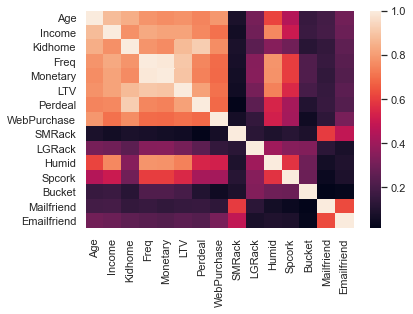

In [292]:
sns.heatmap(df[HighCorr].phik_matrix())

In [293]:
hcorr_non_metric = set.intersection(set(HighCorr),set(non_metric_features))
hcorr_metric = set.intersection(set(HighCorr),set(metric_features))

interval columns not set, guessing: ['Humid', 'Emailfriend', 'Mailfriend', 'Bucket', 'LGRack', 'SMRack', 'Kidhome', 'Spcork']


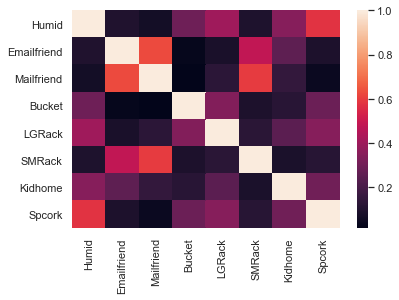

In [294]:
sns.heatmap(df[hcorr_non_metric].phik_matrix())

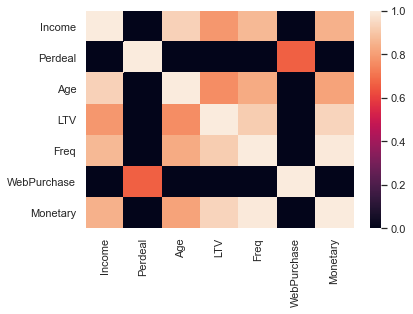

In [295]:
sns.heatmap(df[hcorr_metric].corr(), vmin = 0, vmax = 1)

In [32]:
metric_features1 = data[metric_features].columns
metric_features1

Index(['Dayswus', 'Age', 'Edu', 'Income', 'Freq', 'Recency', 'Monetary', 'LTV',
       'Perdeal', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert',
       'Exotic', 'WebPurchase', 'WebVisit'],
      dtype='object')

In [33]:
metric_features1 = np.array(metric_features1)

In [41]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge
sm1 = sompy.SOMFactory().build(
    data[metric_features].values, 
    mapsize=(25,25), 
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features1
)
sm1.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.003000 seconds
 Rough training...
 radius_ini: 9.000000 , radius_final: 1.500000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.153000, quantization error: 5.796503

 epoch: 2 ---> elapsed time:  0.092000, quantization error: 3.907271

 epoch: 3 ---> elapsed time:  0.087000, quantization error: 3.859212

 epoch: 4 ---> elapsed time:  0.087000, quantization error: 3.828055

 epoch: 5 ---> elapsed time:  0.087000, quantization error: 3.799604

 epoch: 6 ---> elapsed time:  0.086000, quantization error: 3.777499

 epoch: 7 ---> elapsed time:  0.085000, quantization error: 3.756104

 epoch: 8 ---> elapsed time:  0.086000, quantization error: 3.744752

 epoch: 9 ---> elapsed time:  0.092000, quantization error: 3.736985

 epoch: 10 ---> elapsed time:  0.091000, quantization error: 3.728845

 epoch: 11 ---> elapsed time:  0.104000, quantization error: 3.715943

 epoch: 12 ---> elapsed time:  0.146000, quantization error: 3.705583

 epoch: 13 ---> 

 epoch: 14 ---> elapsed time:  0.076000, quantization error: 2.470112

 epoch: 15 ---> elapsed time:  0.070000, quantization error: 2.465180

 epoch: 16 ---> elapsed time:  0.070000, quantization error: 2.460103

 epoch: 17 ---> elapsed time:  0.070000, quantization error: 2.454932

 epoch: 18 ---> elapsed time:  0.074000, quantization error: 2.449779

 epoch: 19 ---> elapsed time:  0.201000, quantization error: 2.444694

 epoch: 20 ---> elapsed time:  0.179000, quantization error: 2.439715

 epoch: 21 ---> elapsed time:  0.202000, quantization error: 2.434481

 epoch: 22 ---> elapsed time:  0.151000, quantization error: 2.429299

 epoch: 23 ---> elapsed time:  0.164000, quantization error: 2.424175

 epoch: 24 ---> elapsed time:  0.171000, quantization error: 2.418891

 epoch: 25 ---> elapsed time:  0.168000, quantization error: 2.413716

 epoch: 26 ---> elapsed time:  0.086000, quantization error: 2.408323

 epoch: 27 ---> elapsed time:  0.073000, quantization error: 2.403028

 epoch

In [42]:
sm1.get_node_vectors()

array([[701.97283709,  33.10852002,  18.27399935, ...,  12.35747077,
         58.68830147,   6.45897882],
       [706.93042263,  34.85394854,  18.28846923, ...,  12.38204747,
         57.63778264,   6.35725715],
       [712.80181244,  36.77654806,  18.33328046, ...,  12.73093317,
         54.20720525,   5.87447828],
       ...,
       [928.27211941,  69.4168797 ,  15.24440748, ...,  12.06775887,
         15.70694971,   2.01501581],
       [945.31245296,  69.98270229,  15.272623  , ...,  11.23497944,
         15.02859459,   2.03397079],
       [972.17663791,  70.38299802,  15.23858163, ...,  11.20227949,
         15.1858946 ,   2.20089304]])

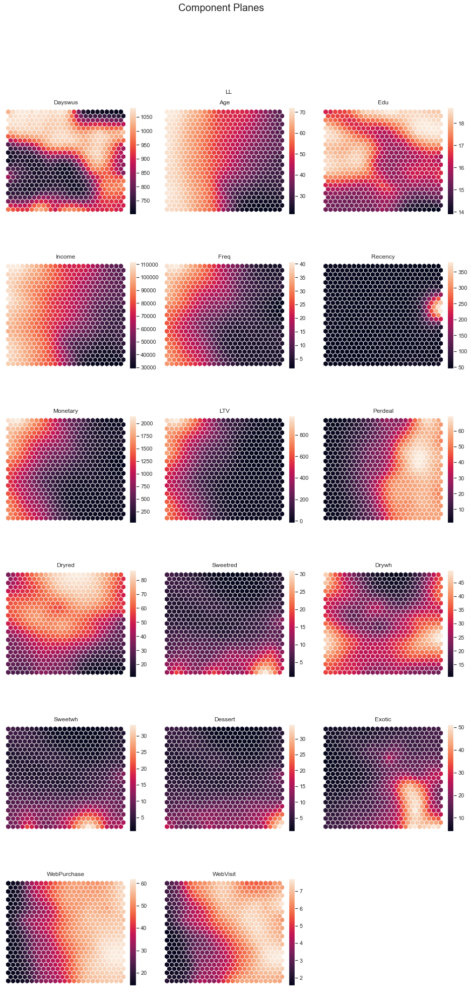

In [43]:
sns.set()
view_2D = View2D(12,12,"LL", text_size=10)
view_2D.show(sm1, col_sz=3, denormalize=True)
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

## Data Preparation

### Data selection 

In [49]:
data_clean = data.copy()

# drop Access 
data_clean = data_clean.drop(['Access'], axis = 1)
data_clean

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,...,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,,,,,,,,,,,,
1001,789,68,16,90782,0,0,29,66,1402,699,...,19,4,0,1,0,0,0,0,0,0
1002,623,78,20,113023,0,0,31,6,1537,565,...,9,1,0,0,0,0,0,0,0,0
1003,583,24,18,28344,1,0,4,69,44,-3,...,59,7,1,0,0,0,0,0,1,1
1004,893,59,19,93571,0,1,21,10,888,207,...,35,5,0,0,0,0,0,0,0,0
1005,1062,59,18,91852,0,1,25,26,1138,355,...,34,6,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10996,967,28,17,54292,0,0,23,72,1011,436,...,31,6,0,0,0,1,0,0,0,0
10997,637,76,15,125962,0,1,33,75,1668,476,...,45,5,0,1,1,0,0,0,0,0
10998,586,69,19,99628,0,0,30,98,1469,618,...,18,3,0,0,0,0,0,0,0,0


In [50]:
data_clean['Recency'].sort_values(ascending=False)

Custid
1548     549
8922     549
3625     549
5832     547
10568    546
        ... 
10259      0
8789       0
6110       0
7983       0
3887       0
Name: Recency, Length: 10000, dtype: int64

In [115]:
#dtale.show(data_clean)

### Data Cleaning

In [55]:
model1 = LocalOutlierFactor(n_neighbors = 1000, metric = "manhattan")

In [58]:
# model fitting
y_pred = model1.fit_predict(data_clean)

In [59]:
y_pred

array([1, 1, 1, ..., 1, 1, 1])

In [62]:
# filter outlier index
outlier_index = where(y_pred == -1) # negative values are outliers and positives inliers

In [63]:
outlier_index

(array([  42,   92,  107,  112,  199,  213,  268,  319,  331,  414,  415,
         423,  461,  478,  483,  493,  503,  538,  581,  583,  588,  598,
         611,  635,  641,  667,  668,  674,  678,  755,  790,  793,  815,
         819,  822,  826,  865,  889,  890,  908,  932, 1024, 1078, 1083,
        1177, 1201, 1205, 1213, 1278, 1326, 1405, 1481, 1491, 1508, 1520,
        1574, 1601, 1614, 1646, 1693, 1702, 1731, 1769, 1771, 1825, 1832,
        1966, 2001, 2050, 2056, 2079, 2152, 2186, 2198, 2235, 2243, 2391,
        2450, 2452, 2479, 2481, 2509, 2535, 2643, 2694, 2702, 2725, 2743,
        2780, 2814, 2827, 2865, 2911, 2915, 2927, 2952, 3035, 3078, 3086,
        3111, 3114, 3194, 3226, 3246, 3288, 3336, 3401, 3498, 3517, 3542,
        3606, 3634, 3655, 3673, 3695, 3698, 3742, 3770, 3915, 4023, 4134,
        4135, 4349, 4361, 4367, 4373, 4416, 4439, 4446, 4507, 4529, 4532,
        4569, 4574, 4590, 4607, 4612, 4644, 4651, 4700, 4721, 4997, 5086,
        5107, 5123, 5148, 5208, 5224, 

In [64]:
len(outlier_index[0])

261

In [65]:
# filter outlier values
outlier_values = data_clean.iloc[outlier_index]

In [66]:
outliers_LOF = (len(outlier_values)/len(data_clean))*100
outliers_LOF

2.6100000000000003

In [68]:
data_clean_outliers = data_clean.drop(data_clean.index[outlier_index])

In [70]:
len(data_clean_outliers)

9739

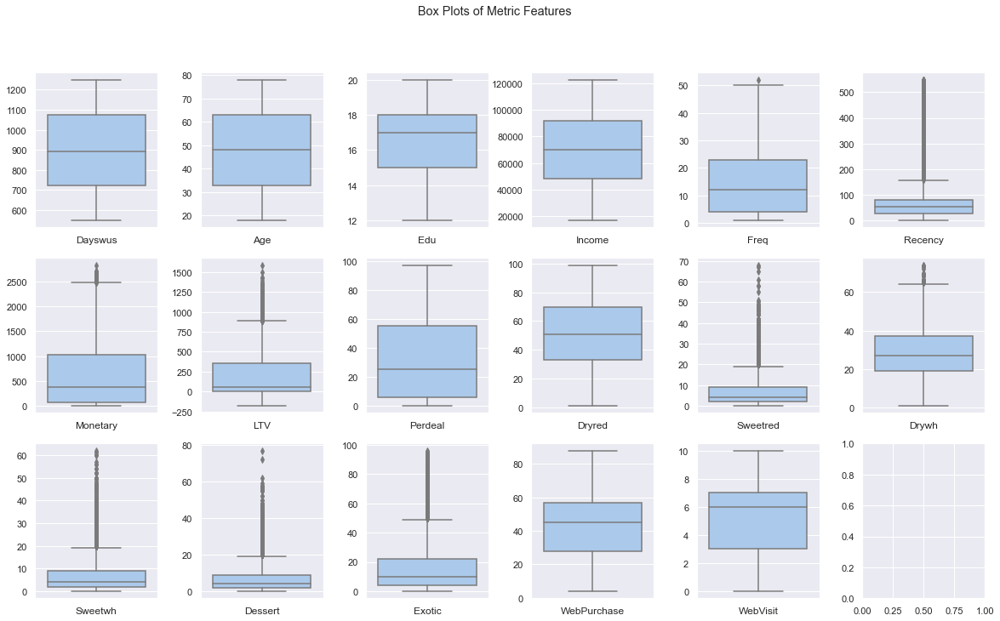

In [71]:
#Metric Features Boxplot
sns.set()
fig, axes = plt.subplots(3, ceil(len(metric_features) / 3), figsize=(20, 11))
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(y=data_clean_outliers[feat], ax=ax, palette = 'pastel')
    ax.set_title(feat, y=-0.13)
    ax.set_ylabel('')

plt.subplots_adjust(wspace = 0.35, bottom = 0.1)
title = "Box Plots of Metric Features"
plt.suptitle(title)
plt.show()

In [75]:
from sklearn.ensemble import IsolationForest

In [76]:
clf = IsolationForest(n_estimators=500,random_state=5,n_jobs=-1,contamination= 0.06).fit(data_clean)

In [77]:
a = clf.predict(data_clean)
a

array([ 1,  1, -1, ...,  1,  1, -1])

In [78]:
# filter outlier index
outlier_index_isolation = where(a == -1) # negative values are outliers and positives inliers

In [79]:
outlier_index_isolation

(array([   2,    5,   12,   21,   23,   39,   44,   45,   51,  104,  111,
         112,  133,  155,  172,  181,  236,  250,  253,  260,  276,  277,
         319,  329,  344,  377,  414,  415,  423,  430,  432,  438,  443,
         481,  482,  493,  525,  529,  538,  547,  583,  587,  609,  634,
         635,  677,  684,  688,  702,  706,  711,  737,  747,  757,  775,
         809,  820,  824,  854,  861,  884,  917,  925,  940,  955,  958,
         993, 1001, 1024, 1041, 1042, 1088, 1090, 1099, 1106, 1136, 1158,
        1164, 1171, 1187, 1193, 1195, 1201, 1217, 1242, 1275, 1320, 1343,
        1344, 1382, 1485, 1491, 1501, 1507, 1547, 1552, 1554, 1561, 1569,
        1600, 1614, 1632, 1637, 1661, 1700, 1729, 1735, 1743, 1750, 1759,
        1769, 1784, 1798, 1809, 1832, 1850, 1892, 1933, 1952, 1966, 1985,
        1988, 1993, 2019, 2023, 2047, 2070, 2078, 2079, 2100, 2105, 2152,
        2154, 2161, 2186, 2198, 2225, 2243, 2265, 2299, 2311, 2318, 2327,
        2331, 2342, 2359, 2371, 2384, 

In [80]:
len(outlier_index_isolation[0])

600

In [83]:
data_clean_outliers_iso = data_clean.drop(data_clean.index[outlier_index_isolation])

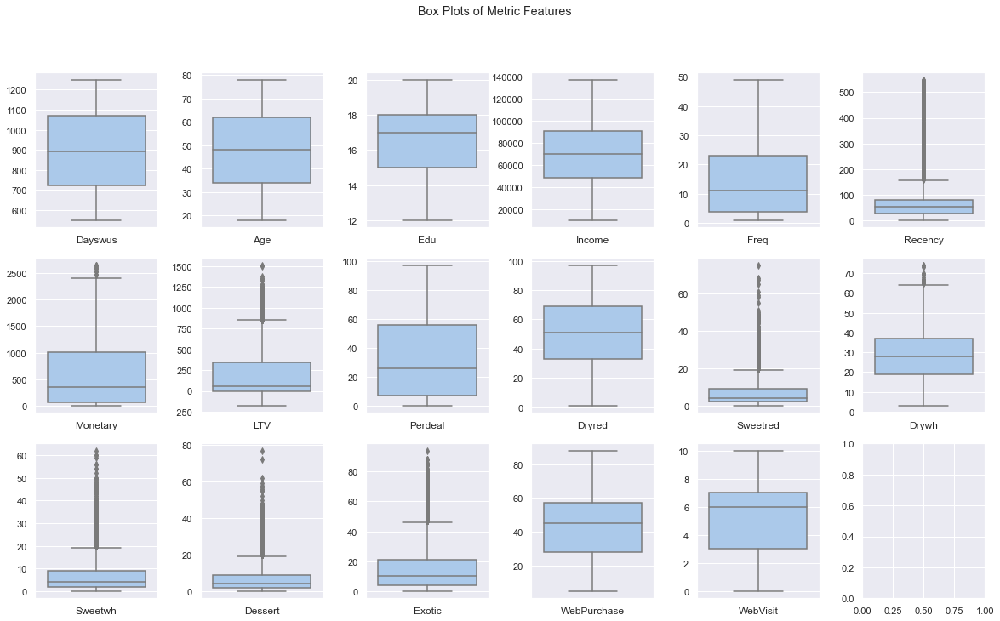

In [85]:
#Metric Features Boxplot
sns.set()
fig, axes = plt.subplots(3, ceil(len(metric_features) / 3), figsize=(20, 11))
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(y=data_clean_outliers_iso[feat], ax=ax, palette = 'pastel')
    ax.set_title(feat, y=-0.13)
    ax.set_ylabel('')

plt.subplots_adjust(wspace = 0.35, bottom = 0.1)
title = "Box Plots of Metric Features"
plt.suptitle(title)
plt.show()

In [100]:
data_clean_outliers

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,...,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,,,,,,,,,,,,
1001,789,68,16,90782,0,0,29,66,1402,699,...,19,4,0,1,0,0,0,0,0,0
1002,623,78,20,113023,0,0,31,6,1537,565,...,9,1,0,0,0,0,0,0,0,0
1003,583,24,18,28344,1,0,4,69,44,-3,...,59,7,1,0,0,0,0,0,1,1
1004,893,59,19,93571,0,1,21,10,888,207,...,35,5,0,0,0,0,0,0,0,0
1005,1062,59,18,91852,0,1,25,26,1138,355,...,34,6,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,1025,39,15,58121,1,1,4,6,61,-8,...,71,8,0,0,0,0,0,0,0,0
10996,967,28,17,54292,0,0,23,72,1011,436,...,31,6,0,0,0,1,0,0,0,0
10998,586,69,19,99628,0,0,30,98,1469,618,...,18,3,0,0,0,0,0,0,0,0


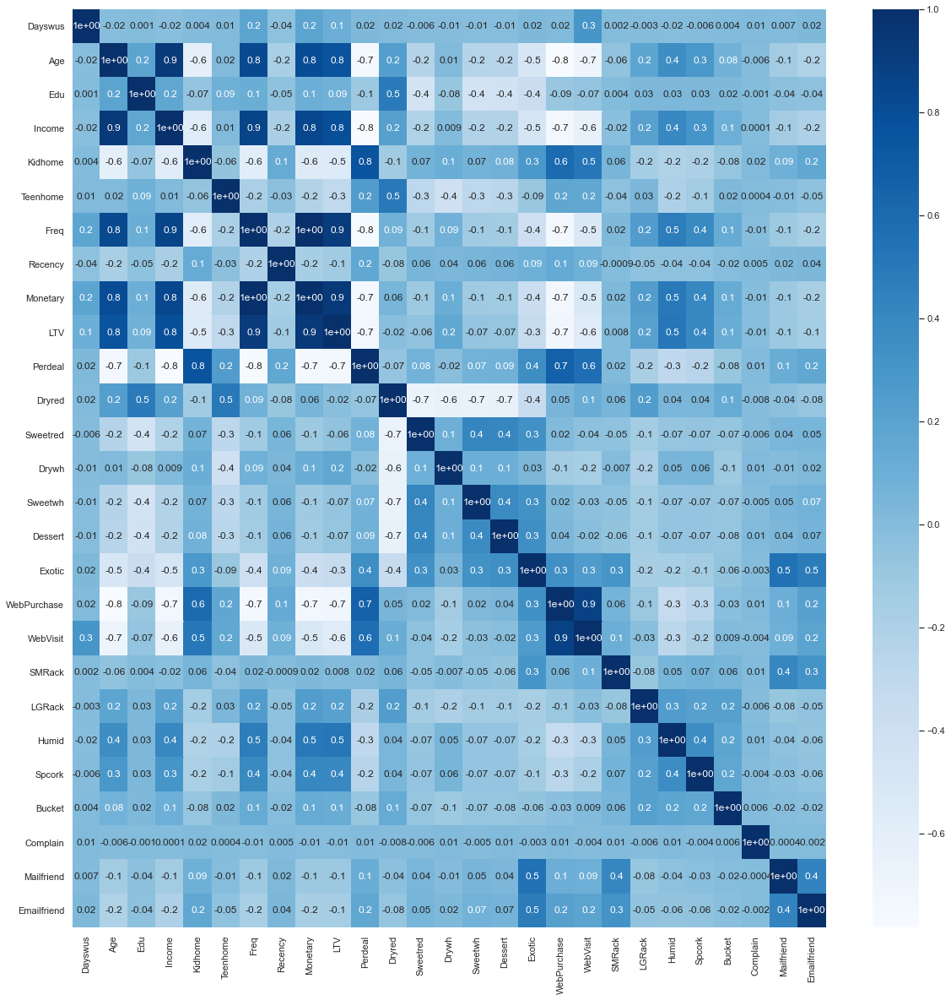

In [103]:
cor_all3 = data_clean_outliers.corr(method = "pearson")
cor_heatmap(cor_all3)

In [72]:
data_clean_outliers.to_csv('cleaneddata.csv')